<a href="https://colab.research.google.com/github/Denis-Shabanov/Denis-Shabanov/blob/main/photo_search_(1)_(2).ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Поиск фото "Со смыслом"

Мы работаетем в фотохостинге для профессиональных фотографов «Со Смыслом» (“With Sense”).

Пользователи размещают свои фотографии на хостинге и сопровождают их полным описанием: указывают место съёмок, модель камеры и т.д. Отличительная особенность сервиса — описание: его может предоставить не только тот, кто размещает фотографию, но и другие пользователи портала.

Наш отдел занимается экспериментом по разработке поиска референсных фотографий для фотографов. Суть поиска заключается в следующем: пользователь сервиса вводит описание нужной сцены. Сервис выводит несколько фотографий с такой же или похожей сценой.

Чтобы эксперимент получил право на жизнь, нужно защитить его перед руководителем компании. Для защиты необходимо презентовать PoC (Proof of Concept, Проверка концепции) — продемонстрировать, что такой проект практически осуществим. Нам поручено разработать демонстрационную версию поиска изображений по запросу.

Для демонстрационной версии нужно выбрать лучшую  модель, которая получит векторное представление изображения, векторное представление текста, а на выходе выдаст число от 0 до 1 — и покажет, насколько текст и картинка подходят друг другу.
На основе лучшей модели можно будет собрать предварительную версию продукта, которую вы покажете руководителю компании.

### Юридические ограничения

В некоторых странах, где работает компания With Sense, действуют ограничения по обработке изображений: поисковым сервисам и сервисам, предоставляющим возможность поиска, запрещено без разрешения родителей или законных представителей предоставлять любую информацию, в том числе, но не исключительно, текстов, изображений, видео и аудио, содержащие описание, изображение или запись голоса детей. Ребёнком считается любой человек, не достигший 16-ти лет.

В нашем сервисе строго следуют законам стран, в которых работают. Поэтому при попытке посмотреть изображения, запрещённые законодательством, вместо картинок показывается дисклеймер:

    This image is unavailable in your country in compliance with local laws.
    
Однако у нас в PoC нет возможности воспользоваться данным функционалом. Поэтому необходимо очистить данные от проблемного контента. Во время тестирования модели при появлении в запросе “вредного” контента должен отображаться дисклеймер.

### Описание данных

В файле `train_dataset.csv` собрана информация, необходимая для обучения: имя файла изображения, идентификатор описания и текст описания. Для одной картинки может быть доступно до 5 описаний. Идентификатор описания имеет формат `<имя файла изображения>#<порядковый номер описания>`.

В папке `train_images` содержатся изображения для тренировки модели.

В файле `CrowdAnnotations.tsv` — данные по соответствию изображения и описания, полученные с помощью краудсорсинга. Номера колонок и соответствующий тип данных:

1. Имя файла изображения.
2. Идентификатор описания.
3. Доля людей, подтвердивших, что описание соответствует изображению.
4. Количество человек, подтвердивших, что описание соответствует изображению.
5. Количество человек, подтвердивших, что описание не соответствует изображению.

В файле `ExpertAnnotations.tsv` содержатся данные по соответствию изображения и описания, полученные в результате опроса экспертов. Номера колонок и соответствующий тип данных:

1. Имя файла изображения.
2. Идентификатор описания.

3, 4, 5 — оценки трёх экспертов.

Эксперты ставят оценки по шкале от 1 до 4, где 1 — изображение и запрос совершенно не соответствуют друг другу, 2 — запрос содержит элементы описания изображения, но в целом запрос тексту не соответствует, 3 — запрос и текст соответствуют с точностью до некоторых деталей, 4 — запрос и текст соответствуют полностью.

В файле `test_queries.csv` находится информация, необходимая для тестирования: идентификатор запроса, текст запроса и релевантное изображение. Для одной картинки может быть доступно до 5 описаний. Идентификатор описания имеет формат `<имя файла изображения>#<порядковый номер описания>`.

В папке `test_images` содержатся изображения для тестирования модели.

## Исследовательский анализ данных

Наш датасет содержит экспертные и краудсорсинговые оценки соответствия текста и изображения.

В файле с экспертными мнениями для каждой пары изображение-текст имеются оценки от трёх специалистов. Для решения задачи вы должны эти оценки агрегировать — превратить в одну. Существует несколько способов агрегации оценок, самый простой — голосование большинства: за какую оценку проголосовала большая часть экспертов (в нашем случае 2 или 3), та оценка и ставится как итоговая. Поскольку число экспертов меньше числа классов, может случиться, что каждый эксперт поставит разные оценки, например: 1, 4, 2. В таком случае данную пару изображение-текст можно исключить из датасета.

В файле с краудсорсинговыми оценками информация расположена в таком порядке:

1. Доля исполнителей, подтвердивших, что текст **соответствует** картинке.
2. Количество исполнителей, подтвердивших, что текст **соответствует** картинке.
3. Количество исполнителей, подтвердивших, что текст **не соответствует** картинке.

После анализа экспертных и краудсорсинговых оценок выберем либо одну из них, либо объединим их в одну по какому-то критерию: например, оценка эксперта принимается с коэффициентом 0.6, а крауда — с коэффициентом 0.4.

Наша модель должна возвращать на выходе вероятность соответствия изображения тексту, поэтому целевая переменная должна иметь значения от 0 до 1.

Загрузим датасет с сервера, распакуем и проверим содержание корневого каталога сессии.

In [50]:
!wget -N https://code.s3.yandex.net/datasets/dsplus_integrated_project_4.zip
!unzip -uq dsplus_integrated_project_4.zip
print('-' * 100)
!ls

--2025-03-17 06:49:51--  https://code.s3.yandex.net/datasets/dsplus_integrated_project_4.zip
Resolving code.s3.yandex.net (code.s3.yandex.net)... 93.158.134.158, 2a02:6b8::2:158
Connecting to code.s3.yandex.net (code.s3.yandex.net)|93.158.134.158|:443... connected.
HTTP request sent, awaiting response... 304 Not Modified
File ‘dsplus_integrated_project_4.zip’ not modified on server. Omitting download.

----------------------------------------------------------------------------------------------------
dsplus_integrated_project_4.zip  __MACOSX  sample_data	to_upload  X.pickle  y.pickle


Установим дополнительные библиотеки Keras-NLP и Sentence-Transformers.

Осуществим импорт библиотек.

In [51]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path
import pickle
from statistics import mode


import nltk
import re
from nltk.corpus import stopwords
nltk.download('stopwords')  # поддерживает удаление стоп-слов
nltk.download('punkt_tab')  # делит текст на список предложений
nltk.download('wordnet')  # проводит лемматизацию
nltk.download('omw-1.4')

from PIL import Image

from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Flatten, Dropout, BatchNormalization
from tensorflow.keras.models import Sequential
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.applications import ResNet50
from tensorflow import keras
import tensorflow as tf
import keras_nlp

from tqdm import notebook

from sklearn.model_selection import GroupShuffleSplit, GridSearchCV, cross_val_score
from sklearn.linear_model import LinearRegression
from sklearn.pipeline import make_pipeline
from sklearn.svm import LinearSVR
from sklearn.metrics import mean_absolute_error, mean_squared_error
from sklearn.preprocessing import StandardScaler

from sentence_transformers import SentenceTransformer, util
import glob

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt_tab to /root/nltk_data...
[nltk_data]   Package punkt_tab is already up-to-date!
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package omw-1.4 to /root/nltk_data...
[nltk_data]   Package omw-1.4 is already up-to-date!


Зададим глобальные переменные. Зафиксируем рандомайзеры.

In [52]:
PATH = '/content/to_upload'
SEED = 31416
BLOCK = ['teenage', 'baby', 'child', 'teenager', 'girl', 'boy', 'kid']

np.random.seed(SEED)
tf.random.set_seed(SEED)

Прочитаем данные из файлов.

In [53]:
def read_df(path=PATH) -> pd.DataFrame:

    '''читаем датафреймы из указанной директории'''

    df_train = pd.read_csv(Path(path, 'train_dataset.csv'))#.sample(frac=0.1)
    df_crowd = pd.read_csv(Path(path, 'CrowdAnnotations.tsv'), sep='\t',
                           names=['image', 'query_id', 'share_pos', 'count_pos', 'count_neg'])
    df_expert = pd.read_csv(Path(path, 'ExpertAnnotations.tsv'), sep='\t',
                           names=['image', 'query_id', 'first', 'second', 'third'])
    df_queries = pd.read_csv(Path(path, 'test_queries.csv'), index_col=[0], sep='|')
    df_images = pd.read_csv(Path(path, 'test_images.csv'), sep='|')

    return df_train, df_crowd, df_expert, df_queries, df_images

df_train, df_crowd, df_expert, df_queries, df_images = read_df()

Посмотрим на данные.

In [54]:
display(df_train.head(), df_crowd.head(), df_expert.head(), df_queries.head(), df_images.head())

,image,query_id,query_text
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
1,1262583859_653f1469a9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
2,2447284966_d6bbdb4b6e.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
3,2549968784_39bfbe44f9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
4,2621415349_ef1a7e73be.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...


,image,query_id,share_pos,count_pos,count_neg
0,1056338697_4f7d7ce270.jpg,1056338697_4f7d7ce270.jpg#2,1.0,3,0
1,1056338697_4f7d7ce270.jpg,114051287_dd85625a04.jpg#2,0.0,0,3
2,1056338697_4f7d7ce270.jpg,1427391496_ea512cbe7f.jpg#2,0.0,0,3
3,1056338697_4f7d7ce270.jpg,2073964624_52da3a0fc4.jpg#2,0.0,0,3
4,1056338697_4f7d7ce270.jpg,2083434441_a93bc6306b.jpg#2,0.0,0,3


,image,query_id,first,second,third
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,1,1,1
1,1056338697_4f7d7ce270.jpg,2718495608_d8533e3ac5.jpg#2,1,1,2
2,1056338697_4f7d7ce270.jpg,3181701312_70a379ab6e.jpg#2,1,1,2
3,1056338697_4f7d7ce270.jpg,3207358897_bfa61fa3c6.jpg#2,1,2,2
4,1056338697_4f7d7ce270.jpg,3286822339_5535af6b93.jpg#2,1,1,2


,query_id,query_text,image
0,1177994172_10d143cb8d.jpg#0,"Two blonde boys , one in a camouflage shirt an...",1177994172_10d143cb8d.jpg
1,1177994172_10d143cb8d.jpg#1,Two boys are squirting water guns at each other .,1177994172_10d143cb8d.jpg
2,1177994172_10d143cb8d.jpg#2,Two boys spraying each other with water,1177994172_10d143cb8d.jpg
3,1177994172_10d143cb8d.jpg#3,Two children wearing jeans squirt water at eac...,1177994172_10d143cb8d.jpg
4,1177994172_10d143cb8d.jpg#4,Two young boys are squirting water at each oth...,1177994172_10d143cb8d.jpg


,image
0,3356748019_2251399314.jpg
1,2887171449_f54a2b9f39.jpg
2,3089107423_81a24eaf18.jpg
3,1429546659_44cb09cbe2.jpg
4,1177994172_10d143cb8d.jpg


Проверим количество уникальных изображений в обучающем и тестовом наборах.

In [55]:
print('Количество уникальных фото на трейне:', len(df_train['image'].unique()))
print('Количество уникальных фото на тесте:', len(df_queries['image'].unique()))

Количество уникальных фото на трейне: 1000
Количество уникальных фото на тесте: 100


In [56]:
print('Количество уникальных запросов на тесте:', df_queries.drop_duplicates().shape[0])

Количество уникальных запросов на тесте: 500


Посмотрим на количество оценок в экспертном и краудсорсинговом наборах.

In [57]:
print('Количество уникальных сочетаний фото-текст оцененных экспертами:', df_expert.drop_duplicates().shape[0])
print('Количество уникальных сочетаний фото-текст оцененных людьми:', df_crowd.drop_duplicates().shape[0])

Количество уникальных сочетаний фото-текст оцененных экспертами: 5822
Количество уникальных сочетаний фото-текст оцененных людьми: 47830


Проверим, все ли текстовые описания в тестовом наборе совпадают с картинками. В столбце `query_id` зашифрована информация о номере картинки к которой дано описание в столбце `query_text`.

In [58]:
df_queries[df_queries['query_id'].str[:-2] != df_queries['image']].shape[0]

0

Проверим соответствие текстовых описаний друг другу в обучающем и тестовом наборах.

In [59]:
print('Уникальных текстовых описаний в трейне:', len(set(df_train['query_text'])))
print('Уникальных текстовых описаний в тесте:', len(set(df_queries['query_text'])))
print('Уникальных текстовых описаний которые есть в обоих наборах:', len(set(df_train['query_text']) & set(df_queries['query_text'])))

Уникальных текстовых описаний в трейне: 977
Уникальных текстовых описаний в тесте: 500
Уникальных текстовых описаний которые есть в обоих наборах: 0


Также проверим не совпадают ли картинки в обучающем и тестовом наборах.

In [60]:
print('Уникальных картинок в трейне:', len(set(df_train['image'])))
print('Уникальных картинок в тесте:', len(set(df_queries['image'])))
print('Уникальных картинок которые есть в обоих наборах:', len(set(df_train['image']) & set(df_queries['image'])))

Уникальных картинок в трейне: 1000
Уникальных картинок в тесте: 100
Уникальных картинок которые есть в обоих наборах: 0


Познакомимся с изображениями, входящими в датасеты.

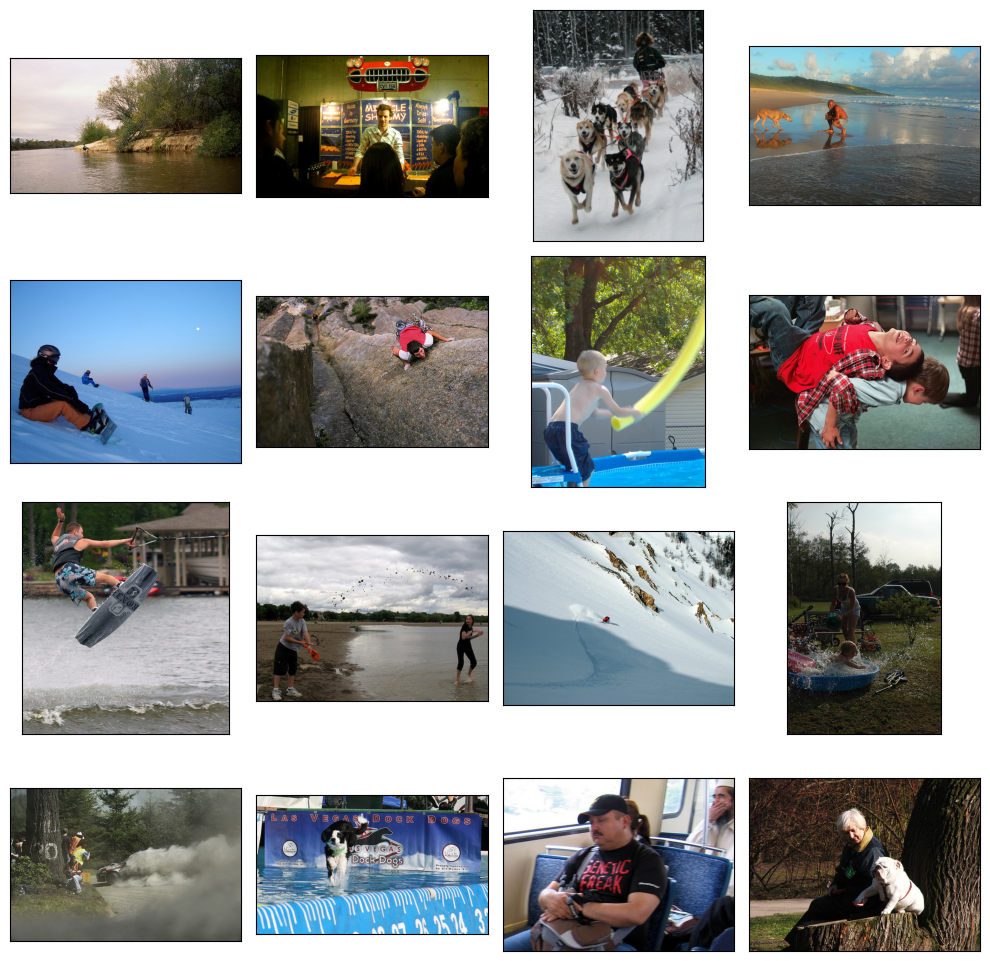

In [61]:
samples_train = list(df_train['image'].sample(8))
samples_test = list(df_queries['image'].sample(8))

fig = plt.figure(figsize=(10,10))
for i in range(8):
    fig.add_subplot(4, 4, i+1)
    image = Image.open(Path(PATH, 'train_images', samples_train[i]))
    plt.imshow(image)
    plt.xticks([])
    plt.yticks([])
    plt.tight_layout()
for i in range(8):
    fig.add_subplot(4, 4, i+9)
    image = Image.open(Path(PATH, 'test_images', samples_test[i]))
    plt.imshow(image)
    plt.xticks([])
    plt.yticks([])
    plt.tight_layout()

### Выводы

Мы загрузили и ознакомились с данными.

Данный набор данных является частью датасета Flickr30k. В нашем распоряжении 1000 картинок на тест и 100 на трейн. Есть предобработанные файлы с сочетаниями описаний и картинок, для трейна и теста.

Для трейна при этом есть как экспертные оценки соответствия 5822 шт. так и оценки выполненные на краудфайдинговой платформе обычными людьми - 47830 шт, они частично совпадают.

Пересечений между наборами данных для трейна и теста не обнаружено.

На трейне использованы только описания картинок под номером #2, в тесте же к каждой картинке даны по 5 описаний.

Перейдём к аггрегации оценок для получения тестов.

## Аггрегация оценок

Напишем функцию для агрегации оценок экспертов и применим к набору данных.

Если все оценки разные - будем усреднять оценку и приводить к диапазону [0,1], если есть несколько одинаковых оценок - проголосуем большинством.

In [62]:
def expert_aggregate(row) -> object:
    '''
    Аггрегирует экспертную оценку усреднением ответов и сведением к диапазону [0, 1].

    Параметры:
    - row: Строка датафрейма с колонками 'first', 'second', 'third'.

    Возвращает:
    - row: Строка с добавленной колонкой 'expert_score'.
    '''
    # Получаем оценки экспертов
    scores = [row['first'], row['second'], row['third']]

    # Если все оценки разные, усредняем
    if len(set(scores)) == 3:
        row['expert_score'] = (sum(scores) - 3) / 9  # Приводим к диапазону [0, 1]

    # Если есть одинаковые оценки, используем моду (наиболее частое значение)
    else:
        row['expert_score'] = (mode(scores) - 1) / 3  # Приводим к диапазону [0, 1]

    return row

# Применяем функцию к датафрейму
df_expert = df_expert.apply(expert_aggregate, axis=1)

Поскольку только 2329 пар картинка-текст имеют оценки и людей и экспертов мы объединим оба блока с оценками с флагом `outer`. Таким образом у части пар будут оценки экспертов (как более надёжные), для некоторых оценки людей, для остальных смешанная оценка. Далее мы объединим оценки.

In [63]:
# Объединяем оценки экспертов и краудсорсинга
df_scores = pd.merge(df_expert, df_crowd, how='outer', on=['image', 'query_id'])

def score_aggregate(row) -> object:
    '''
    Аггрегирует оценки экспертов и краудсорсинга:
    - Если есть только экспертная оценка, используем её.
    - Если есть только краудсорсинговая оценка, используем её.
    - Если есть обе оценки, объединяем их с весами 0.7 (экспертная) и 0.3 (краудсорсинговая).

    Параметры:
    - row: Строка датафрейма с колонками 'expert_score' и 'share_pos'.

    Возвращает:
    - row: Строка с добавленной колонкой 'score'.
    '''
    # Если нет экспертной оценки, используем краудсорсинговую
    if pd.isna(row['expert_score']):
        row['score'] = row['share_pos']

    # Если нет краудсорсинговой оценки, используем экспертную
    elif pd.isna(row['share_pos']):
        row['score'] = row['expert_score']

    # Если есть обе оценки, объединяем их с весами
    else:
        row['score'] = row['expert_score'] * 0.7 + row['share_pos'] * 0.3

    return row

# Применяем функцию к датафрейму
df_scores = df_scores.apply(score_aggregate, axis=1)

Проверим результат.

In [64]:
display(df_scores['score'].isna().value_counts())
df_scores['score'].describe()

,count
score,
False,51323


,score
count,51323.000000
mean,0.075967
std,0.208417
min,0.000000
25%,0.000000
50%,0.000000
75%,0.000000
max,1.000000


Добавим цели в наши датасеты.

In [65]:
df_train = pd.merge(df_train, df_scores[['image', 'query_id', 'score']], how='outer', on=['image', 'query_id'])

In [66]:
to_fill = df_train[df_train['query_text'].notna()]

Заполним пропуски в описании после добавления оценок людей.

In [67]:
def fill_text(row) -> object:

    '''заполняем пропуски текстов в тренировочном наборе данных'''

    if pd.isnull(row['query_text']):
        texts = to_fill[to_fill['query_id'] == row['query_id']]['query_text']
        if len(texts) > 0:
            row['query_text'] = texts.iloc[0]

    return row

df_train = df_train.apply(fill_text, axis=1)

In [68]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 51323 entries, 0 to 51322
Data columns (total 4 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   image       51323 non-null  object 
 1   query_id    51323 non-null  object 
 2   query_text  50214 non-null  object 
 3   score       51323 non-null  float64
dtypes: float64(1), object(3)
memory usage: 1.6+ MB


После добавления текстов, оказалось что для части `query_id` нет описаний, поэтому их отбросим.

In [69]:
df_train.dropna(inplace=True)
df_train.info()

<class 'pandas.core.frame.DataFrame'>
Index: 50214 entries, 0 to 51322
Data columns (total 4 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   image       50214 non-null  object 
 1   query_id    50214 non-null  object 
 2   query_text  50214 non-null  object 
 3   score       50214 non-null  float64
dtypes: float64(1), object(3)
memory usage: 1.9+ MB


### Выводы

Выбрали метод и аггрегировали оценки. Объединили оценки с обучающим набором данных, заполнили пропуски, удалили NaN'ы. Цели готовы, перейдём к проверке данных.

## 2. Проверка данных

В некоторых странах, где работает ваша компания, действуют ограничения по обработке изображений: поисковым сервисам и сервисам, предоставляющим возможность поиска, запрещено без разрешения родителей или законных представителей предоставлять любую информацию, в том числе, но не исключительно тексты, изображения, видео и аудио, содержащие описание, изображение или запись голоса детей. Ребёнком считается любой человек, не достигший 16 лет.

В вашем сервисе строго следуют законам стран, в которых работают. Поэтому при попытке посмотреть изображения, запрещённые законодательством, вместо картинок показывается дисклеймер:

> This image is unavailable in your country in compliance with local laws
>

Однако у нас в PoC нет возможности воспользоваться данным функционалом. Поэтому все изображения, которые нарушают данный закон, нужно удалить из обучающей выборки.

Для избавления от нелегального контента мы воспользуемся текстовыми описаниями файлов.

Объявим список слов для поиска нелегального контента.

Очистим, токенизируем и лемматизируем текст, чтобы было легче искать запросы связанные с детьми. Отметим в обучающем наборе фото подлежащие блокировке.

In [70]:
lemmatize = nltk.WordNetLemmatizer()

def get_lemmas(text) -> list:

    '''очищаем текст и превращаем в список лемм'''

    text = re.sub('[^a-zA-Z]', ' ', text).lower() # удаляем неалфавитные символы, приводим к нижнему регистру
    text = nltk.word_tokenize(text, language = 'english') # токенизируем слова
    text = [lemmatize.lemmatize(word) for word in text] # лемматирзируем слова

    return text

def cleaning(row) -> object:

    '''отмечаем тексты для блокирования'''

    text = get_lemmas(row['query_text'])
    if [i for i in text if i in BLOCK]:
        row['to_block'] = 1
    else:
        row['to_block'] = 0

    return row

In [71]:
%time df_train = df_train.apply(cleaning, axis=1)

CPU times: user 38.2 s, sys: 145 ms, total: 38.3 s
Wall time: 38.4 s


Просмотрим какие тексты оказались заблокированны.

In [72]:
print(df_train[df_train['to_block'] == 1]['query_text'].sample(10).unique())

['A small child climbs a large rock while someone casting a shadow takes her picture .'
 'A woman holding a little girls hand is pointing to something trying to show her .'
 'A group of people with their backs to the camera and a little girl facing a lady .'
 'A little girl with a yellow dress blows the whistle .'
 'A woman with holding a young girl playing with bubbles at a picnic .'
 'Three boys are running on the beach playing a game .'
 'A young asian girl with a woman plays with a blue ball in a part setting .'
 'Six children , all with black hair , sit at a table for a picture .'
 'Three children in a black dog kennel .'
 'Two children playing with a ball on the grass .']


Также посмотрим на случайные картинки которые попали под правило блокировки. Для поиска картинок воспользуемся тем что поле `query_id` таблицы `df_train` содержит закодированное имя картинки соответствующей этому описанию.

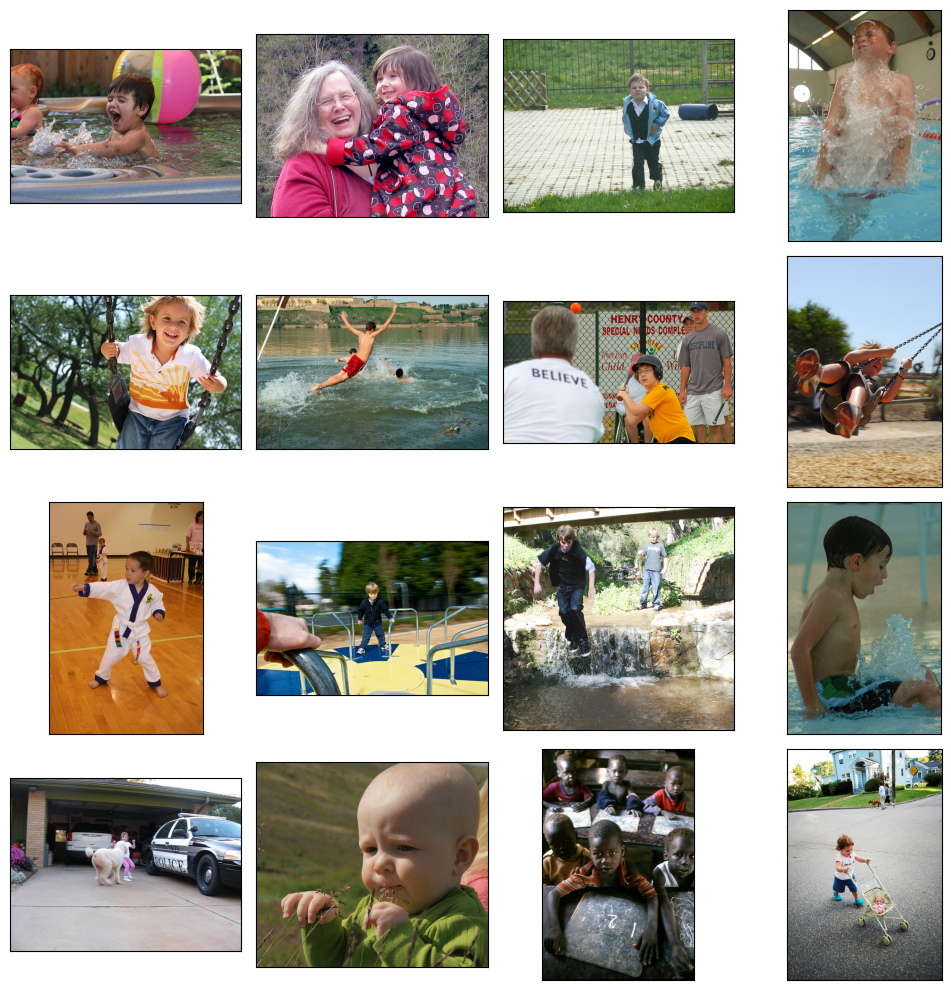

In [73]:
samples = list(df_train[df_train['to_block'] == 1]['query_id'].sample(16))
samples = [i[:-2] for i in samples]

fig = plt.figure(figsize=(10,10))
for i in range(16):
    fig.add_subplot(4, 4, i+1)
    image = Image.open(Path(PATH, 'train_images', samples[i]))
    plt.imshow(image)
    plt.xticks([])
    plt.yticks([])
    plt.tight_layout()

Похоже что мы верно отметили фотографии. Удалим строки с фото с детьми из набора данных.

In [74]:
df_train.drop(df_train[df_train['to_block'] == 1].index, inplace=True, errors='ignore')
df_train.drop(columns='to_block', inplace=True, errors='ignore')
df_train.reset_index(inplace=True, drop=True)

Проверим полученные датасеты.

In [75]:
display(df_train.head(), df_queries.head())
df_train.info()
print('-' * 100)
df_queries.info()

,image,query_id,query_text,score
0,1056338697_4f7d7ce270.jpg,1056338697_4f7d7ce270.jpg#2,"A woman is signaling is to traffic , as seen f...",1.0
1,1056338697_4f7d7ce270.jpg,2073964624_52da3a0fc4.jpg#2,"A woman wearing black clothes , a purple scarf...",0.0
2,1056338697_4f7d7ce270.jpg,2083434441_a93bc6306b.jpg#2,An older woman with blond hair rides a bicycle...,0.0
3,1056338697_4f7d7ce270.jpg,2204550058_2707d92338.jpg#2,A woman wearing a white glove peers over the c...,0.0
4,1056338697_4f7d7ce270.jpg,2224450291_4c133fabe8.jpg#2,A man taking a picture with a silver camera .,0.0


,query_id,query_text,image
0,1177994172_10d143cb8d.jpg#0,"Two blonde boys , one in a camouflage shirt an...",1177994172_10d143cb8d.jpg
1,1177994172_10d143cb8d.jpg#1,Two boys are squirting water guns at each other .,1177994172_10d143cb8d.jpg
2,1177994172_10d143cb8d.jpg#2,Two boys spraying each other with water,1177994172_10d143cb8d.jpg
3,1177994172_10d143cb8d.jpg#3,Two children wearing jeans squirt water at eac...,1177994172_10d143cb8d.jpg
4,1177994172_10d143cb8d.jpg#4,Two young boys are squirting water at each oth...,1177994172_10d143cb8d.jpg


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 36125 entries, 0 to 36124
Data columns (total 4 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   image       36125 non-null  object 
 1   query_id    36125 non-null  object 
 2   query_text  36125 non-null  object 
 3   score       36125 non-null  float64
dtypes: float64(1), object(3)
memory usage: 1.1+ MB
----------------------------------------------------------------------------------------------------
<class 'pandas.core.frame.DataFrame'>
Index: 500 entries, 0 to 499
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   query_id    500 non-null    object
 1   query_text  500 non-null    object
 2   image       500 non-null    object
dtypes: object(3)
memory usage: 15.6+ KB


### Выводы

Мы проверили данные и исключили из обучения все описания содержащие запрещённую информацию. Перейдём к векторизации изображений.

## Векторизация изображений

Обратимся к свёрточным сетям: они позволяют "выделить" главные компоненты изображений. Возьмём архитектуру ResNet-50, посмотрим на слои и исключим полносвязные слои, которые отвечают за конечное предсказание. При этом загрузим модель данной архитектуры, предварительно натренированную на датасете ImageNet.

Напишем функции загрузчиков изображений.

In [76]:
def load_train(path=PATH, df_train=df_train, batch_size=16, image_size=(256, 256), seed=SEED):
    '''
    Загрузчик данных для обучения с использованием tf.data.Dataset.

    Параметры:
    - path: Путь к директории с изображениями.
    - df_train: Датафрейм с колонками 'image' (имя файла) и 'score' (метка).
    - batch_size: Размер батча.
    - image_size: Размер изображений (высота, ширина).
    - seed: Случайное зерно для воспроизводимости.

    Возвращает:
    - tf.data.Dataset: Dataset, содержащий пары (изображение, метка).
    '''
    # Полный путь к изображениям
    image_paths = [str(Path(path, 'train_images', img)) for img in df_train['image']]
    labels = df_train['score'].values

    # Создание Dataset из путей к изображениям и меток
    dataset = tf.data.Dataset.from_tensor_slices((image_paths, labels))

    # Функция для загрузки и предобработки изображений
    def load_and_preprocess_image(image_path, label):
        image = tf.io.read_file(image_path)
        image = tf.image.decode_jpeg(image, channels=3)  # Используем decode_jpeg для JPG
        image = tf.image.resize(image, image_size)
        image = image / 255.0  # Нормализация
        return image, label

    # Применение функции к каждому элементу Dataset
    dataset = dataset.map(load_and_preprocess_image, num_parallel_calls=tf.data.AUTOTUNE)

    # Перемешивание и батчинг
    dataset = dataset.shuffle(buffer_size=1000, seed=seed)  # Уменьшим размер буфера для shuffle
    dataset = dataset.batch(batch_size)
    dataset = dataset.prefetch(tf.data.AUTOTUNE)  # Ускорение загрузки данных

    return dataset

Проверим выдачу полученного генератора.

Количество изображений в батче: 16


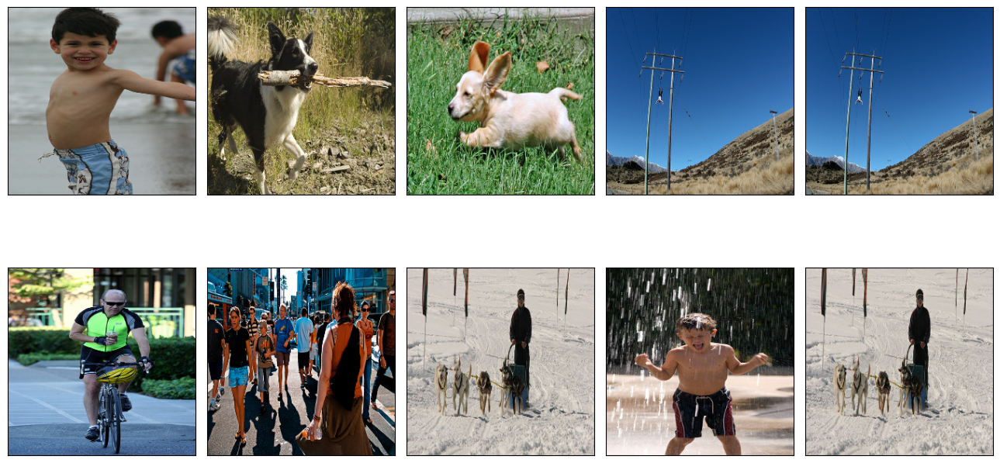

In [77]:
# Загрузка данных
flow_train = load_train(path=PATH, df_train=df_train, batch_size=16, image_size=(256, 256), seed=SEED)

# Получение одного батча данных
for features, target in flow_train.take(1):  # take(1) берёт один батч
    break

# Проверка количества элементов в батче
num_images = features.shape[0]
print(f"Количество изображений в батче: {num_images}")

# Визуализация изображений
import matplotlib.pyplot as plt

fig = plt.figure(figsize=(13, 10))
for i in range(min(10, num_images)):  # Отображаем не более 10 изображений
    fig.add_subplot(2, 5, i+1)
    plt.imshow(features[i].numpy())  # Преобразуем тензор в numpy для отображения
    plt.xticks([])
    plt.yticks([])
    plt.tight_layout()
plt.show()

В набор попали фотографии с детьми, т.к. в строках с низкой оценкой есть сравнения с такими фотографиями.

Объявим модель.

In [78]:
def create_model(input_shape=(256, 256, 3)):
    '''
    Задаём архитектуру сети.

    Параметры:
    - input_shape: Размер входного изображения (по умолчанию (256, 256, 3)).

    Возвращает:
    - model: Скомпилированная модель.
    '''
    backbone = ResNet50(
        input_shape=input_shape,
        weights='imagenet',  # Используем предобученные веса
        include_top=False    # Исключаем верхние слои (полносвязные)
    )
    model = Sequential([
        backbone,
        GlobalAveragePooling2D(),
    ])
    optimizer = Adam(learning_rate=1e-3)
    model.compile(optimizer=optimizer, loss='mean_squared_error', metrics=['mean_absolute_error'])
    return model

Получим эмбеддинги наших картинок.

In [79]:
def vectorize_pictures(model, train_data):
    '''
    Превращаем данные в вектор.

    Параметры:
    - model: Обученная модель.
    - train_data: Данные для векторизации.

    Возвращает:
    - predictions: Векторизованные данные.
    '''
    predictions = model.predict(train_data)
    return predictions

In [80]:
# Загрузка данных
flow_train = load_train(path=PATH, df_train=df_train, batch_size=16, image_size=(256, 256), seed=SEED)

# Векторизация изображений
pict_embeds = vectorize_pictures(create_model(), flow_train)

# Вывод результата
print(pict_embeds.shape)  # Ожидаемый результат: (количество изображений, размер вектора)

2258/2258 ━━━━━━━━━━━━━━━━━━━━ 172s 73ms/step
(36125, 2048)


### Выводы

Получили векторизированные картинки, теперь перейдём к текстам.

## Векторизация текстов

Следующий этап — векторизация текстов. Для векторизации тектов применим трансформер BERT из библиоетки Keras-NLP.

Загрузим трансформер BERT base cased EN без классифицирующей головы.

In [81]:
bert = keras_nlp.models.BertBackbone.from_preset('bert_base_en')

Загрузим препроцессор для нашего трансформера.

In [82]:
preprocessor = keras_nlp.models.BertPreprocessor.from_preset('bert_base_en')

Напишем функцию для получения эмбеддингов.

In [83]:
def vectorize_text(model, data, preprocessor=preprocessor, batch_size=32, bar=True, verbose=0) -> np.array:

    '''преобразуем тексты в словарь токенов, масок и паддингов'''

    embeddings = []
    tokenized = preprocessor(data)

    if bar:
        for i in notebook.tqdm(range(tokenized['token_ids'].shape[0] // batch_size + 1)):

            tokens = tokenized['token_ids'][batch_size*i:batch_size*(i+1)]
            token_types = tokenized['segment_ids'][batch_size*i:batch_size*(i+1)]
            mask = tokenized['padding_mask'][batch_size*i:batch_size*(i+1)]

            batch = {'token_ids' : tokens,
                    'segment_ids' : token_types,
                    'padding_mask' : mask}

            batch_embeddings = model.predict(batch, verbose=verbose)

            embeddings.append(batch_embeddings['pooled_output'])

    else:
        for i in range(tokenized['token_ids'].shape[0] // batch_size + 1):

            tokens = tokenized['token_ids'][batch_size*i:batch_size*(i+1)]
            token_types = tokenized['segment_ids'][batch_size*i:batch_size*(i+1)]
            mask = tokenized['padding_mask'][batch_size*i:batch_size*(i+1)]

            batch = {'token_ids' : tokens,
                    'segment_ids' : token_types,
                    'padding_mask' : mask}

            batch_embeddings = model.predict(batch, verbose=verbose)

            embeddings.append(batch_embeddings['pooled_output'])

    return np.concatenate(embeddings)

Преобразуем наши тексты для подачи в функцию.

In [84]:
text = list(df_train['query_text'])

Запустим получение эмбеддингов.

In [85]:
%%time

text_embeds = vectorize_text(model=bert, data=text)

  0%|          | 0/1129 [00:00<?, ?it/s]

CPU times: user 19min 43s, sys: 8.48 s, total: 19min 52s
Wall time: 22min 41s


In [86]:
text_embeds.shape

(36125, 768)

### Выводы

Мы загрузили модель BERT base cased EN и получили эмбеддинги наших текстов. Теперь их необходимо объединить.

## 5. Объединение векторов

Подготовим данные для обучения: объединим векторы изображений и векторы текстов с целевой переменной.

In [87]:
X = np.concatenate((pict_embeds, text_embeds), axis=1)
X.shape

(36125, 2816)

In [88]:
y = np.array(df_train['score'])
y.shape

(36125,)

Чтобы на каждом эксперименте с моделями не пересчитывать вектора, сохраним данные для последующей быстрой загрузки.

In [89]:
with open('X.pickle', 'wb') as f:
    pickle.dump(X, f)

with open('y.pickle', 'wb') as f:
    pickle.dump(y, f)

In [90]:
'''with open('X.pickle', 'rb') as f:
    X = pickle.load(f)
with open('y.pickle', 'rb') as f:
    y = pickle.load(f)
print(X.shape)
print(y.shape)'''

"with open('X.pickle', 'rb') as f:\n    X = pickle.load(f)\nwith open('y.pickle', 'rb') as f:\n    y = pickle.load(f)\nprint(X.shape)\nprint(y.shape)"

### Выводы

Признаки и цели готовы, можно обучать модели.

## 6. Обучение модели предсказания соответствия

Для обучения разделим датасет на тренировочную и тестовую выборки. Простое случайное разбиение не подходит: нужно исключить попадание изображения и в обучающую, и в тестовую выборки.
Для того чтобы учесть изображения при разбиении, можно воспользоваться классом `GroupShuffleSplit` из библиотеки `sklearn.model_selection`.

Сначала получим обучающую и тестовые выборки.

In [91]:
gss = GroupShuffleSplit(n_splits=1, train_size=.8, random_state=SEED)
train_indices, test_indices = next(gss.split(X=X, y=y, groups=df_train['image']))

In [92]:
X_train, X_test = X[train_indices], X[test_indices]

In [93]:
y_train, y_test = y[train_indices], y[test_indices]

Отмасштабируем наши данные.

In [94]:
scaler = StandardScaler().fit(X_train)
X_train = scaler.transform(X_train)
X_test = scaler.transform(X_test)

### LinearRegression

В качестве baseline'а попробуем модель линейной регрессии.

В качестве метрики мы рассматривали коэффициент детерминации r2 (доля дисперсии, объясняемая моделью), но он малоинформативен для нашей задачи. MAPE является хорошей мерой близости, но в случае когда цели близки к нулю может давать завышенные результаты и при этом лучше себя показывает если среди целей есть большой разброс. Лучше будет воспользоваться в качестве метрики MAE или RMSE, при этом RMSE будет активнее реагировать на большие выбросы предсказаниях (т.к. цель и предсказания возводятся в квадрат до вычисления разницы). Остановимся на RMSE.

In [95]:
%%time
model = LinearRegression(n_jobs=-1)
model.fit(X_train, y_train)
score = cross_val_score(
    model, X_train, y_train, groups=df_train['image'].loc[train_indices],
    scoring='neg_root_mean_squared_error',
    cv=GroupShuffleSplit(random_state=SEED)
).mean()
abs(score).round(decimals=3)

CPU times: user 3min 14s, sys: 2.1 s, total: 3min 16s
Wall time: 1min 56s


0.22

Проверим на тесте.

In [97]:
pred = model.predict(X_test)
rmse = np.sqrt(mean_squared_error(y_test, pred))
print(rmse)

0.2213415966456712


### LinearSVR

Попробуем модель на основе метода опорных векторов.

Зададим параметры сетки для перебора в GridSearch.

In [98]:
model = LinearSVR(random_state=SEED, max_iter=1000)

param_grid = {
    'loss': ['squared_epsilon_insensitive'],
    'C': [1]
}

# Уменьшаем число разбиений, чтобы ускорить кросс-валидацию
cv = GroupShuffleSplit(n_splits=2, test_size=0.2, random_state=SEED)

gs_svr = GridSearchCV(
    model,
    param_grid,
    scoring='neg_root_mean_squared_error',
    n_jobs=2,  # Оптимально для Colab
    cv=cv,
    verbose=1
)

Проведём подбор гиперпараметров.

In [99]:
%time gs_svr.fit(X_train, y_train, groups=df_train['image'].loc[train_indices])

Fitting 2 folds for each of 1 candidates, totalling 2 fits
CPU times: user 18min 26s, sys: 4.94 s, total: 18min 31s
Wall time: 43min 13s


GridSearchCV(cv=GroupShuffleSplit(n_splits=2, random_state=31416, test_size=0.2,
         train_size=None),
             estimator=LinearSVR(random_state=31416), n_jobs=2,
             param_grid={'C': [1], 'loss': ['squared_epsilon_insensitive']},
             scoring='neg_root_mean_squared_error', verbose=1)

Посмотрим на результат.

In [100]:
pd.DataFrame(gs_svr.cv_results_)[['param_C', 'param_loss', 'mean_test_score', 'rank_test_score']].round(decimals=3)

,param_C,param_loss,mean_test_score,rank_test_score
0,1,squared_epsilon_insensitive,-0.222,1


Проверим полученную модель на тесте.

In [101]:
pred = gs_svr.predict(X_test)
# Вычисляем абсолютные ошибки
absolute_errors = np.abs(y_test - pred)

# Находим среднее значение
mae = np.mean(absolute_errors)

# Округляем до 3 знаков после запятой
mae = round(mae, 3)

print("Mean Absolute Error:", mae)

Mean Absolute Error: 0.14


### NeuralNetwork

Создадим трёхслоёную нейронную сеть.

In [102]:
X_train.shape

(28786, 2816)

In [103]:
NN = Sequential()
NN.add(Dense(2816, input_shape=(2816,), activation='relu'))
NN.add(BatchNormalization())
NN.add(Dense(256, activation='relu'))
NN.add(BatchNormalization())
NN.add(Dense(1, activation='relu'))

optimizer = Adam(learning_rate=1e-5)

NN.compile(optimizer=optimizer, loss='mean_squared_error',
            metrics=[tf.keras.metrics.RootMeanSquaredError()])

NN.build()

NN.summary()

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense (Dense)                        │ (None, 2816)                │       7,932,672 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization                  │ (None, 2816)                │          11,264 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 256)                 │         721,152 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_1                │ (None, 256)                 │           1,024 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (None, 1)                   │             257 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 8,666,369 (33.06 MB)

 Trainable params: 8,660,225 (33.04 MB)

 Non-trainable params: 6,144 (24.00 KB)

In [104]:
NN.fit(
    X_train, y_train,
    validation_data=(X_test, y_test),
    batch_size=32, epochs=10,
    verbose=2, shuffle=True
    )

Epoch 1/10
900/900 - 10s - 11ms/step - loss: 0.2632 - root_mean_squared_error: 0.5130 - val_loss: 0.1081 - val_root_mean_squared_error: 0.3288
Epoch 2/10
900/900 - 7s - 8ms/step - loss: 0.0774 - root_mean_squared_error: 0.2781 - val_loss: 0.0955 - val_root_mean_squared_error: 0.3090
Epoch 3/10
900/900 - 4s - 5ms/step - loss: 0.0480 - root_mean_squared_error: 0.2192 - val_loss: 0.0793 - val_root_mean_squared_error: 0.2816
Epoch 4/10
900/900 - 5s - 5ms/step - loss: 0.0402 - root_mean_squared_error: 0.2005 - val_loss: 0.0856 - val_root_mean_squared_error: 0.2926
Epoch 5/10
900/900 - 4s - 5ms/step - loss: 0.0366 - root_mean_squared_error: 0.1913 - val_loss: 0.0845 - val_root_mean_squared_error: 0.2907
Epoch 6/10
900/900 - 5s - 6ms/step - loss: 0.0379 - root_mean_squared_error: 0.1946 - val_loss: 0.0705 - val_root_mean_squared_error: 0.2654
Epoch 7/10
900/900 - 5s - 5ms/step - loss: 0.0375 - root_mean_squared_error: 0.1937 - val_loss: 0.0700 - val_root_mean_squared_error: 0.2645
Epoch 8/10


### Выводы

Модели LinearSVR и NN показали схожие результаты. Можем использовать в дальнейшей работе любую из них.

## 7. Тестирование модели

Настало время протестировать модель. Для этого получим эмбеддинги для всех тестовых изображений из папки `test_images`, выберем случайные 10 запросов из файла `test_queries.csv` и для каждого запроса выведем наиболее релевантное изображение. Сравним визуально качество поиска.

Создадим загрузчик тестовых изображений.

In [105]:
def load_test(path=PATH, target_size=(256, 256), batch_size=16, seed=SEED):
    '''
    Загрузчик данных для тестирования.

    Args:
        path (str): Путь к папке с данными.
        target_size (tuple): Размер изображений (ширина, высота).
        batch_size (int): Размер батча.
        seed (int): Семя для воспроизводимости.

    Returns:
        tf.data.Dataset: Датасет с тестовыми изображениями.
    '''
    # Путь к папке с тестовыми изображениями
    test_dir = Path(path, 'test_images')

    # Создаем датасет из папки с изображениями
    test_dataset = tf.keras.utils.image_dataset_from_directory(
        directory=test_dir,
        labels=None,  # У нас нет меток, так как это тестовые данные
        image_size=target_size,
        batch_size=batch_size,
        seed=seed,
        shuffle=False  # Не перемешиваем, чтобы сохранить порядок изображений
    )

    # Нормализуем изображения (если требуется)
    normalization_layer = tf.keras.layers.Rescaling(1./255)
    test_dataset = test_dataset.map(lambda x: normalization_layer(x))

    return test_dataset

Получим эмбеддинги тестовых картинок.

In [106]:
%%time

pict_embeds_test = vectorize_pictures(create_model(), load_test())
pict_embeds_test.shape

Found 100 files.
7/7 ━━━━━━━━━━━━━━━━━━━━ 10s 1s/step
CPU times: user 11.3 s, sys: 653 ms, total: 11.9 s
Wall time: 21.7 s


(100, 2048)

Напишем функцию, принимающую на вход текстовое описание и возвращающую 5 картиной с максимальной предсказанной оценкой схожести.

In [107]:
def get_picture(text) -> None:

    '''Проверяем легальность запроса, получаем наиболее похожие картинки,
    если описание среди оригинальных картинок - добавляем последней верную'''

    if [i for i in get_lemmas(text) if i in BLOCK]: #проверяем не нужно ли вывести на экран заглушку
        print('')
        print('-' * 20, text, '-' * 20)
        print('')
        print('This image is unavailable in your country in compliance with local laws.')
        print('')
    else:
        text_embed = vectorize_text(model=bert, data=[text], bar=False) #получаем эмбеддинг текста
        X = np.concatenate(( #объединяем вектора тестовых картинок с эмбеддингом текста
            pict_embeds_test,
            np.resize(text_embed, (pict_embeds_test.shape[0],768))),
            axis=1)
        X = scaler.transform(X)
        predictions = NN.predict(X) #получаем предсказания оценок экспертов
        df = pd.concat((df_images, pd.Series(np.reshape(predictions, (predictions.shape[0],)), name='pred')), axis=1) #добавляем оценки к номерам картинок
        top = list(df.sort_values(by='pred', ascending=False)['image'].head(5)) #получили топ 5 имён файлов с картинками
        top_score = list(df.sort_values(by='pred', ascending=False)['pred'].head(5)) #получили топ 5 оценок

        print('')
        print('-' * 20, text, '-' * 20)
        print('')

        fig = plt.figure(figsize=(15,5)) #выводим на экран 5 наиболее похожих картинок
        plt.rcParams['axes.edgecolor'] = 'black'
        plt.rcParams['axes.linewidth'] = 0
        for i in range(5):
            fig.add_subplot(1, 6, i+1, title=round(top_score[i], 2))
            image = Image.open(Path(PATH, 'test_images', top[i]))
            plt.imshow(image)
            plt.xticks([])
            plt.yticks([])
            plt.tight_layout()

        if text in list(df_queries['query_text']): #если текст был в исходном файле с описаниями - добавляем оригинальную картинку
            plt.rcParams['axes.edgecolor'] = 'green'
            plt.rcParams['axes.linewidth'] = 5
            fig.add_subplot(1, 6, 6)
            image = Image.open(Path(PATH, 'test_images', df_queries.iloc[df_queries[df_queries['query_text'] == text].index[0]]['image']))
            plt.imshow(image)
            plt.xticks([])
            plt.yticks([])
            plt.tight_layout()

        plt.show()

    return None

Теперь выберем 10 случайных запросов из файла с тестовыми запросами и посмотрим на результаты.

In [108]:
samples = df_queries.sample(10)
text_test = list(samples['query_text'])
text_test

['A man is videotaping something .',
 'A dog wrapped with straps is walking away from a red tray holding a bag .',
 'Two people on a sled riding down a snowy hill .',
 'A white bulldog sitting on a tree stump gives paw to an older woman wearing a black jacket .',
 'Five women in red shirts clapping .',
 'A woman and girl riding downhill on a sled with a dog running alongside them',
 'Two black dogs are playing with an orange stuffed dog toy .',
 'A dog jumping off a dock into a pool of water .',
 'A little boy in a green soccer uniform is running on the grass .',
 'A boy with an orange tool on the shore is spraying a girl standing in shallow water with mud .']

4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 117ms/step

-------------------- A man is videotaping something . --------------------



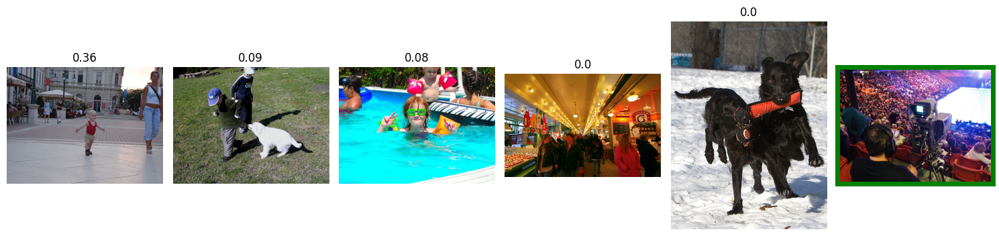

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step

-------------------- A dog wrapped with straps is walking away from a red tray holding a bag . --------------------



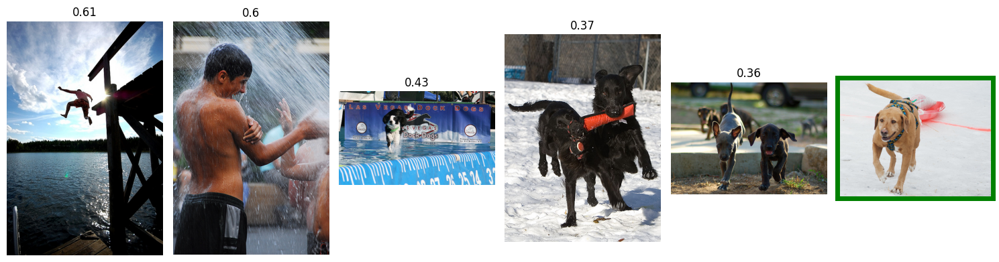

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step

-------------------- Two people on a sled riding down a snowy hill . --------------------



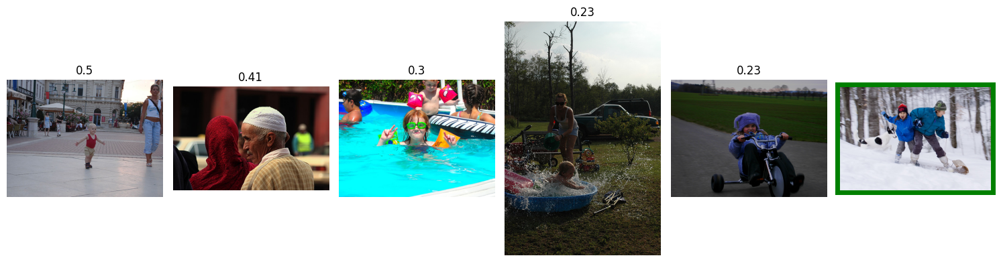

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step

-------------------- A white bulldog sitting on a tree stump gives paw to an older woman wearing a black jacket . --------------------



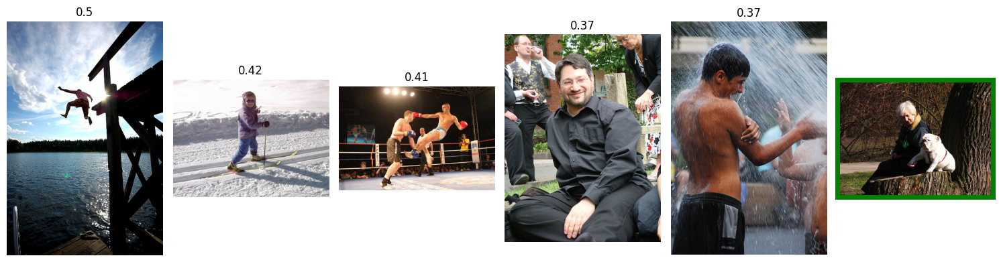

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step

-------------------- Five women in red shirts clapping . --------------------



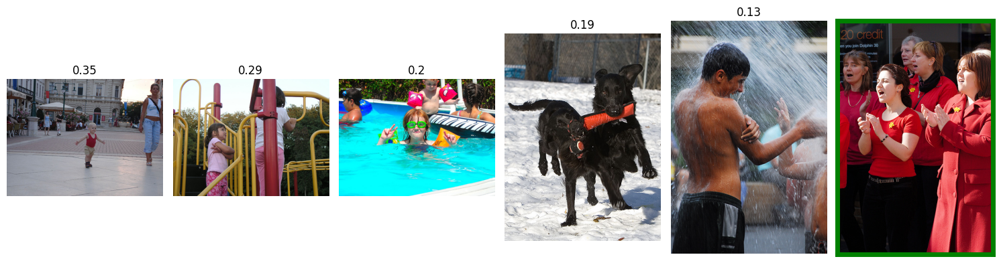


-------------------- A woman and girl riding downhill on a sled with a dog running alongside them --------------------

This image is unavailable in your country in compliance with local laws.

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step

-------------------- Two black dogs are playing with an orange stuffed dog toy . --------------------



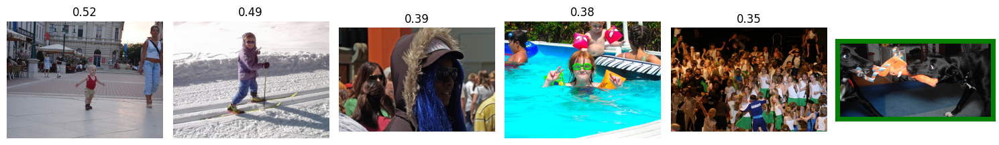

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step

-------------------- A dog jumping off a dock into a pool of water . --------------------



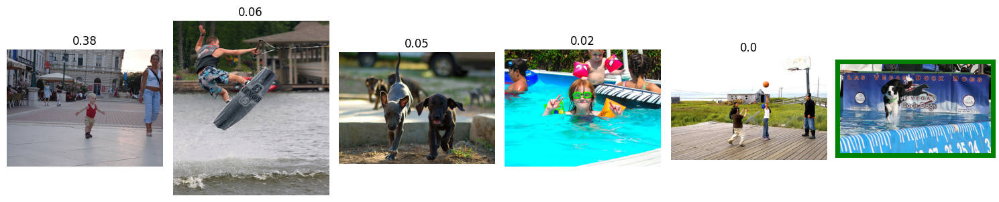


-------------------- A little boy in a green soccer uniform is running on the grass . --------------------

This image is unavailable in your country in compliance with local laws.


-------------------- A boy with an orange tool on the shore is spraying a girl standing in shallow water with mud . --------------------

This image is unavailable in your country in compliance with local laws.



In [109]:
for text in text_test:
    get_picture(text)

## Заключение

В данной работе мы делали MVP для системы поиска изображений по фотографии.

В ходе работы для векторизации изображений мы использовали сеть ResNet50, а для текстовых эмбеддингов BERT base cased EN.

После объединения признаков и выделения целей (экспертные оценки схожести описания и картинок), мы исследовали три модели для оценки схожести:

   * LinearRegression
   * LinearSVR
   * трёхслойную нейронную сеть

Лучше всего себя показала нейронная сеть, с ней мы провели тесты.

В конце работы мы написали функцию которая по тексту возвращает 5 наиболее похожих картинок и протестировали её на предложенном наборе тестовых картинок.

К сожалению выбранный подход не оправдал себя. Лишь в некоторых случаях в топ5 выдачи попадает верная картинка и, чуть чаще, попадают картинки связанные тематически.

В качестве возможных путей для решения можно предложить использовать полный набор картинок из датасета Flickr30k и смену архитектуры решения.

# Эпилог

В заключительной части мы рассмотрим готовое коробочное решение для задачи поиска картинки по тексту.

Мы будем использовать библиотеку `sentence-transformers` с предобученным нейросетевым триплетом `clip-ViT-B-32` на 400М пар изображение-описание. В данной модели эмбеддинги картинок и текста переводятся в одно векторное пространство, в котором вектора пар картинка-текст будут максимально коллинеарны друг другу.

Для начала объявим и загрузим саму модель.

In [110]:
model = SentenceTransformer('clip-ViT-B-32')

/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


modules.json:   0%|          | 0.00/122 [00:00<?, ?B/s]

config_sentence_transformers.json:   0%|          | 0.00/116 [00:00<?, ?B/s]

README.md:   0%|          | 0.00/1.91k [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/605M [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/389 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/4.03k [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/961k [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

preprocessor_config.json:   0%|          | 0.00/316 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/604 [00:00<?, ?B/s]

Далее создадим список с путями к картинкам из тестового набора и получим эмбеддинги этих картинок.

In [111]:
img_names = list(glob.glob(str(Path(PATH, 'test_images', '*.jpg'))))
img_emb = model.encode([Image.open(filepath) for filepath in img_names], batch_size=16, convert_to_tensor=True, show_progress_bar=True)

Batches:   0%|          | 0/7 [00:00<?, ?it/s]

Теперь напишем функцию поиска картинки по тексту.

In [112]:
def search(query) -> None:

    '''Проверяем легальность запроса, получаем наиболее похожие картинки,
    если описание среди оригинальных картинок - добавляем последней верную'''

    if [i for i in get_lemmas(query) if i in BLOCK]: #проверяем не нужно ли вывести на экран заглушку
        print('')
        print('-' * 20, query, '-' * 20)
        print('')
        print('This image is unavailable in your country in compliance with local laws.')
        print('')
    else:
        query_emb = model.encode([query], convert_to_tensor=True, show_progress_bar=False) #получаем эмбеддинг запроса
        # Используем функцию util.semantic_search, которая вычисляет косинусную схожесть
        # между эмбеддингом запроса и всеми картинками из базы.
        # Далее функция возвращает top_k картинок с наивысшим рейтингом
        hits = util.semantic_search(query_emb, img_emb, top_k=5)[0]
        print('')
        print('-' * 20, query, '-' * 20)
        print('')

        fig = plt.figure(figsize=(15,5)) #выводим на экран 5 наиболее похожих картинок
        plt.rcParams['axes.edgecolor'] = 'black'
        plt.rcParams['axes.linewidth'] = 0
        for i in range(5):
            fig.add_subplot(1, 6, i+1, title=round(hits[i]['score'], 2))
            image = Image.open(img_names[hits[i]['corpus_id']])
            plt.imshow(image)
            plt.xticks([])
            plt.yticks([])
            plt.tight_layout()

        if query in list(df_queries['query_text']): #если текст был в исходном файле с описаниями - добавляем оригинальную картинку
            plt.rcParams['axes.edgecolor'] = 'green'
            plt.rcParams['axes.linewidth'] = 5
            fig.add_subplot(1, 6, 6)
            image = Image.open(Path(PATH, 'test_images', df_queries.iloc[df_queries[df_queries['query_text'] == query].index[0]]['image']))
            plt.imshow(image)
            plt.xticks([])
            plt.yticks([])
            plt.tight_layout()

        plt.show()

    return None

Выберем 5 случайных запросов из файла `df_queries`.

In [113]:
samples = df_queries.sample(5)
queries = list(samples['query_text'])
queries

['The girl is blowing out the candles on the chocolate cake .',
 'Three men form an arch during a BMX bike race sponsored by Coca-Cola .',
 'A woman works by a sewing machine .',
 'People using an outdoor ice skating rink .',
 'A sad looking dog sitting next to shrubs .']

Применим функцию поиска и посмотрим на результат.


-------------------- The girl is blowing out the candles on the chocolate cake . --------------------

This image is unavailable in your country in compliance with local laws.


-------------------- Three men form an arch during a BMX bike race sponsored by Coca-Cola . --------------------



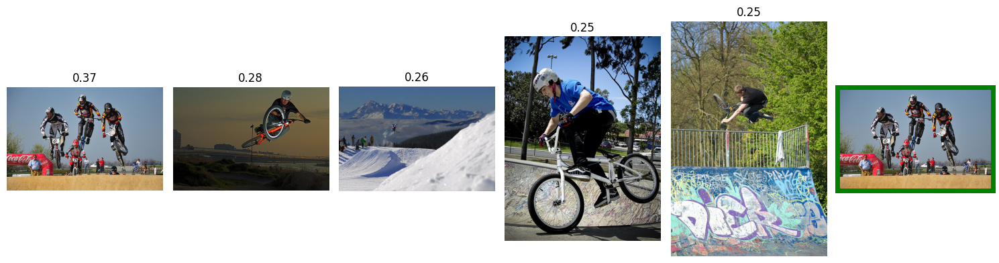


-------------------- A woman works by a sewing machine . --------------------



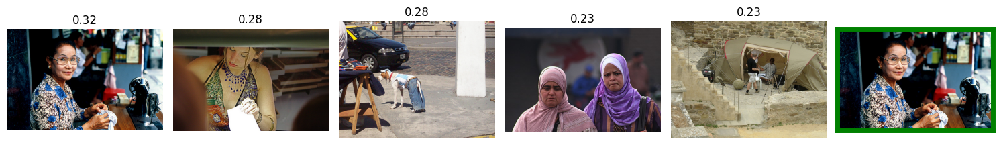


-------------------- People using an outdoor ice skating rink . --------------------



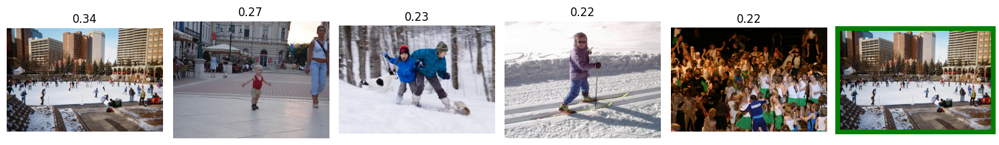


-------------------- A sad looking dog sitting next to shrubs . --------------------



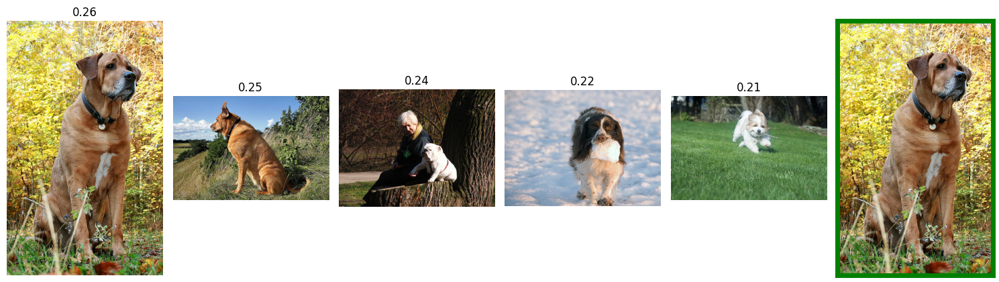

In [114]:
for query in queries:
    search(query)